# Creación de env e instalación de paquetes

### Create new environment:

conda creare -name TAREA_TRES

### Activate new environment

conda activate TAREA_TRES

### Install package:

conda install -c conda-forge python=3 geopandas

### Importar librerías

In [1]:
# Manipulación de datos
import numpy as np
import pandas as pd
from pandas import Series, DataFrame

# Visualización
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Circle
import seaborn as sns
from IPython.display import display, HTML

# Geodatos y análisis espacial
import geopandas as gpd
from geopandas import GeoSeries
from shapely.geometry import LineString, Point, Polygon
from scipy.spatial.distance import cdist

# Mapas interactivos
import folium
from folium import Circle, CircleMarker
from folium.plugins import MarkerCluster

# Otros
import os

### Lectura de la bbdd de  instituciones

In [2]:
cv_data = pd.read_html('listado_iiee.xls')[0]
print(cv_data.head())

   Código Modular  Anexo                      Nombre de SS.EE.  Ubigeo  \
0          257048      0               001 NIÑO JESUS DE PRAGA   10101   
1          257055      0            002 RAQUEL ROBLES DE ROMAN   10101   
2          257097      0  006 MARIA PALMIR SANCHEZ DE REATEGÜI   10101   
3          568097      0                                   020   10101   
4          667576      0        025 BRYAN ANTONIO LOPEZ CASTRO   10101   

  Departamento    Provincia     Distrito  Código DRE/UGEL   DRE / UGEL  \
0     AMAZONAS  CHACHAPOYAS  CHACHAPOYAS            10001  CHACHAPOYAS   
1     AMAZONAS  CHACHAPOYAS  CHACHAPOYAS            10001  CHACHAPOYAS   
2     AMAZONAS  CHACHAPOYAS  CHACHAPOYAS            10001  CHACHAPOYAS   
3     AMAZONAS  CHACHAPOYAS  CHACHAPOYAS            10001  CHACHAPOYAS   
4     AMAZONAS  CHACHAPOYAS  CHACHAPOYAS            10001  CHACHAPOYAS   

  Centro Poblado  Código Centro Poblado  Código Local  \
0    CHACHAPOYAS               131197.0          19.0

In [3]:
# Cambiamos el nombre de Ubigeo para poder hacer el merge luego
cv_data = cv_data.rename({'Ubigeo':'UBIGEO'}, axis =1 )
cv_data.head(5)

,Código Modular,Anexo,Nombre de SS.EE.,UBIGEO,Departamento,Provincia,Distrito,Código DRE/UGEL,DRE / UGEL,Centro Poblado,Código Centro Poblado,Código Local,Dirección,Nivel / Modalidad,Gestion / Dependencia,Latitud,Longitud,Altitud,Fuente de coordenadas
0,257048,0,001 NIÑO JESUS DE PRAGA,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,10001,CHACHAPOYAS,CHACHAPOYAS,131197.0,19.0,JIRON JUNIN 979,Inicial - Jardín,Pública - Sector Educación,-6.231760,-77.872430,2330,UBICACION_WEB (LOCAL)
1,257055,0,002 RAQUEL ROBLES DE ROMAN,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,10001,CHACHAPOYAS,CHACHAPOYAS,131197.0,24.0,JIRON JUNIN 697,Inicial - Jardín,Pública - Sector Educación,-6.231590,-77.870020,2348,UBICACION_WEB (LOCAL)
2,257097,0,006 MARIA PALMIR SANCHEZ DE REATEGÜI,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,10001,CHACHAPOYAS,CHACHAPOYAS,131197.0,38.0,JIRON PUNO 261,Inicial - Jardín,Pública - Sector Educación,-6.227000,-77.875520,2351,UBICACION_WEB (LOCAL)
3,568097,0,020,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,10001,CHACHAPOYAS,CHACHAPOYAS,131197.0,57.0,JIRON AMAZONAS S/N,Inicial - Jardín,Pública - Sector Educación,-6.229603,-77.864544,2350,UGELCENSO_GPS (LOCAL)
4,667576,0,025 BRYAN ANTONIO LOPEZ CASTRO,10101,AMAZONAS,CHACHAPOYAS,CHACHAPOYAS,10001,CHACHAPOYAS,CHACHAPOYAS,131197.0,321.0,PASAJE JOSE FABIAN SANTILLAN S/N,Inicial - Jardín,Pública - Sector Educación,-6.225840,-77.868020,2314,UBICACION_WEB (LOCAL)


### Importación del Shape File por distritos

In [4]:
maps = gpd.read_file('../shape_file/DISTRITOS.shp')
maps.head(5)

,IDDPTO,DEPARTAMEN,IDPROV,PROVINCIA,IDDIST,DISTRITO,CAPITAL,CODCCPP,AREA,FUENTE,geometry
0,10,HUANUCO,1009,PUERTO INCA,100902,CODO DEL POZUZO,CODO DEL POZUZO,0001,1,INEI,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297..."
1,10,HUANUCO,1009,PUERTO INCA,100904,TOURNAVISTA,TOURNAVISTA,0001,1,INEI,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828..."
2,25,UCAYALI,2503,PADRE ABAD,250305,ALEXANDER VON HUMBOLDT,ALEXANDER VON HUMBOLDT,0001,1,INEI,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742..."
3,25,UCAYALI,2503,PADRE ABAD,250302,IRAZOLA,SAN ALEJANDRO,0001,1,INEI,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569..."
4,25,UCAYALI,2503,PADRE ABAD,250304,NESHUYA,MONTE ALEGRE,0001,1,INEI,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446..."


In [5]:
# Nos quedamos con las columnas relevantes y cambiamos el nombre de IDDIST para hacer el merge luego
maps = maps[['IDDIST', 'geometry']]
maps = maps.rename({'IDDIST':'UBIGEO'}, axis =1 )
maps.head(5)

,UBIGEO,geometry
0,100902,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297..."
1,100904,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828..."
2,250305,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742..."
3,250302,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569..."
4,250304,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446..."


In [6]:
# Para poder hacer el merge, ambas columnas deben estar en el mismo formato: Object or srting to int
maps['UBIGEO'] = maps['UBIGEO'].astype(str).astype(int)
maps.head(5)

,UBIGEO,geometry
0,100902,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297..."
1,100904,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828..."
2,250305,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742..."
3,250302,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569..."
4,250304,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446..."


In [7]:
# Vemos los valores que tienen para saber como proceder con el filtrado
valores_unicos = cv_data['Nivel / Modalidad'].unique().tolist()
valores_unicos

['Inicial - Jardín',
 'Secundaria',
 'Primaria',
 'Inicial - Cuna Jardín',
 'Básica Alternativa - Inicial e Intermedio',
 'Básica Alternativa - Avanzado',
 'Técnico Productiva - CETPRO',
 'Inicial No Escolarizado',
 'Básica Especial - Inicial',
 'Básica Especial - Primaria',
 'Instancia de Apoyo',
 'Superior Tecnológica',
 'Básica Especial - PRITE',
 'Superior Pedagógica',
 'Escuela Superior Pedagógica',
 'Superior Formación Artística',
 'Inicial - Cuna',
 'Escuela Superior Tecnológica']

# TASK 1

### Creamos las funciones que nos ayudarán a filtrar instituciones

In [8]:
# Función para filtrar escuelas por nivel
def filtrar_escuelas_por_nivel(cv_data, nivel):

    if nivel == 'Inicial':
        # Filtra todas las filas que contienen 'Inicial' en la columna Nivel_Modalidad
        base_nivel= cv_data[cv_data['Nivel / Modalidad'].str.contains('Inicial')]
    elif nivel == 'Primaria':
        # Filtra todas las filas que contienen 'Primaria' en la columna Nivel_Modalidad
        base_nivel= cv_data[cv_data['Nivel / Modalidad'].str.contains('Primaria')]
    elif nivel == 'Secundaria':
        # Filtra todas las filas que contienen 'Secundaria' en la columna Nivel_Modalidad
        base_nivel= cv_data[cv_data['Nivel / Modalidad'].str.contains('Secundaria')]
    else:
        raise ValueError(f"Nivel '{nivel}' no reconocido.")
    
    return base_nivel

# Función para contar escuelas por distrito
def contar_escuelas_por_distrito(base_nivel):
    # Agrupar y contar
    conteo = base_nivel.groupby(['Departamento', 'Provincia', 'Distrito', 'UBIGEO']).size().reset_index(name='Cantidad')
    print(f"Tamaño antes del merge: {conteo.shape}")
    #Saber si UBIGEO es único antes del merge
    print(f"UBIGEO no tiene repretidos: {conteo['UBIGEO'].is_unique}")

    # Hacemos el merge para unir la geometría
    conteo_con_geom = maps.merge(conteo, how="inner", on="UBIGEO")
    print(f"Tamaño después del merge: {conteo_con_geom.shape}")

    # Calcular total
    total_escuelas = conteo_con_geom['Cantidad'].sum()

    # Mostrar un resumen
    print(f"Total de escuelas: {total_escuelas}")
    display(conteo_con_geom[['Departamento', 'Provincia', 'Distrito', 'Cantidad', 'geometry']])  # Mostrar primeras 10 filas
    return conteo_con_geom, total_escuelas

### Mapa estático para INICIAL

Creamos la base de datos

In [9]:
nivel = 'Inicial'  # O el nivel que quieras
base_inicial = filtrar_escuelas_por_nivel(cv_data, nivel)
conteo_con_geom, total_escuelas = contar_escuelas_por_distrito(base_inicial)

Tamaño antes del merge: (1891, 5)
UBIGEO no tiene repretidos: True
Tamaño después del merge: (1872, 6)
Total de escuelas: 54404


,Departamento,Provincia,Distrito,Cantidad,geometry
0,HUANUCO,PUERTO INCA,CODO DEL POZUZO,34,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297..."
1,HUANUCO,PUERTO INCA,TOURNAVISTA,24,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828..."
2,UCAYALI,PADRE ABAD,ALEXANDER VON HUMBOLDT,7,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742..."
3,UCAYALI,PADRE ABAD,IRAZOLA,27,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569..."
4,UCAYALI,PADRE ABAD,NESHUYA,24,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446..."
...,...,...,...,...,...
1867,HUANUCO,LEONCIO PRADO,CASTILLO GRANDE,11,"POLYGON ((-76.08083 -9.13017, -76.08026 -9.130..."
1868,HUANUCO,LEONCIO PRADO,PUEBLO NUEVO,16,"POLYGON ((-75.88828 -9.00906, -75.88756 -9.010..."
1869,HUANUCO,LEONCIO PRADO,SANTO DOMINGO DE ANDA,11,"POLYGON ((-75.91141 -8.88593, -75.91182 -8.886..."
1870,PUNO,SAN ROMAN,SAN MIGUEL,85,"POLYGON ((-70.13203 -15.33382, -70.12355 -15.3..."


Creamos el histograma y el mapa estático

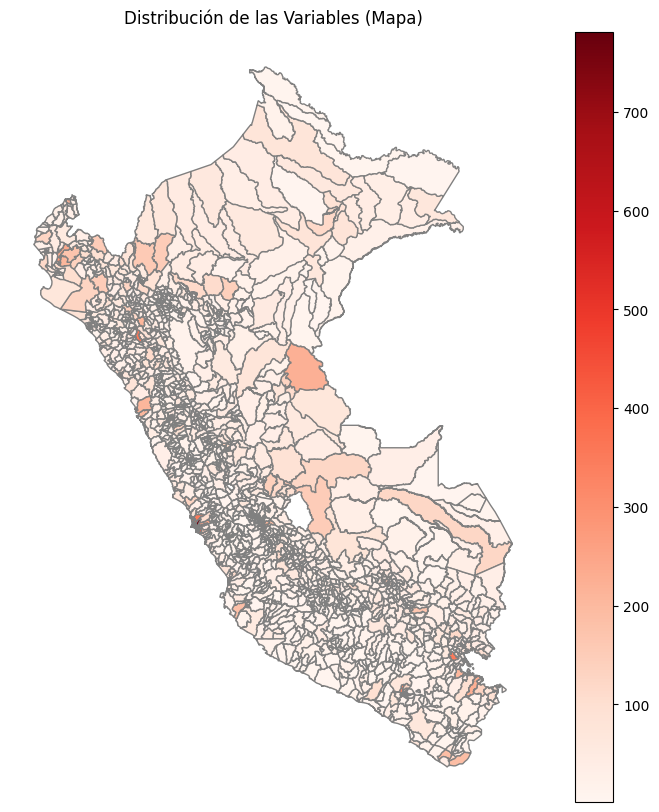

In [10]:
import matplotlib.pyplot as plt

# Crear figura y ejes
fig, ax = plt.subplots(figsize=(10, 10))

# Graficar el mapa con la variable 'Cantidad'
conteo_con_geom.plot(column='Cantidad', cmap='Reds', 
                     ax=ax, legend=True, 
                     linestyle='-', edgecolor='gray')

# Añadir título
ax.set_title("Distribución de las Variables (Mapa)")

# Quitar ejes si deseas
ax.axis('off')

# Guardar el gráfico como imagen PNG
plt.savefig("Distribución de escuelas iniciales.png", dpi=300, bbox_inches='tight')

# Mostrar el gráfico
plt.show()



### Mapa estático para PRIMARIA

Creamos la base de datos

In [11]:
nivel = 'Primaria'  # O el nivel que quieras
base_primaria = filtrar_escuelas_por_nivel(cv_data, nivel)
conteo_con_geom, total_escuelas = contar_escuelas_por_distrito(base_primaria)

Tamaño antes del merge: (1890, 5)
UBIGEO no tiene repretidos: True
Tamaño después del merge: (1872, 6)
Total de escuelas: 38905


,Departamento,Provincia,Distrito,Cantidad,geometry
0,HUANUCO,PUERTO INCA,CODO DEL POZUZO,49,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297..."
1,HUANUCO,PUERTO INCA,TOURNAVISTA,29,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828..."
2,UCAYALI,PADRE ABAD,ALEXANDER VON HUMBOLDT,11,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742..."
3,UCAYALI,PADRE ABAD,IRAZOLA,31,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569..."
4,UCAYALI,PADRE ABAD,NESHUYA,28,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446..."
...,...,...,...,...,...
1867,HUANUCO,LEONCIO PRADO,CASTILLO GRANDE,13,"POLYGON ((-76.08083 -9.13017, -76.08026 -9.130..."
1868,HUANUCO,LEONCIO PRADO,PUEBLO NUEVO,13,"POLYGON ((-75.88828 -9.00906, -75.88756 -9.010..."
1869,HUANUCO,LEONCIO PRADO,SANTO DOMINGO DE ANDA,12,"POLYGON ((-75.91141 -8.88593, -75.91182 -8.886..."
1870,PUNO,SAN ROMAN,SAN MIGUEL,35,"POLYGON ((-70.13203 -15.33382, -70.12355 -15.3..."


Creamos el histograma y el mapa estático

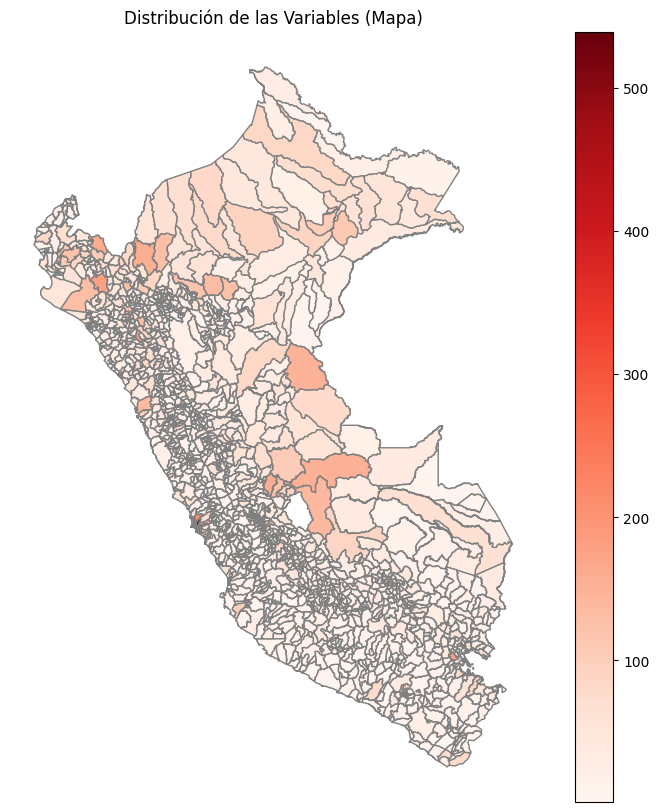

In [12]:
import matplotlib.pyplot as plt

# Crear figura y ejes
fig, ax = plt.subplots(figsize=(10, 10))

# Graficar el mapa con la variable 'Cantidad'
conteo_con_geom.plot(column='Cantidad', cmap='Reds', 
                     ax=ax, legend=True, 
                     linestyle='-', edgecolor='gray')

# Añadir título
ax.set_title("Distribución de las Variables (Mapa)")

# Quitar ejes si deseas
ax.axis('off')

# Guardar el gráfico como imagen PNG
plt.savefig("Distribución de escuelas primarias.png", dpi=300, bbox_inches='tight')

# Mostrar el gráfico
plt.show()



### Mapa estático para SECUNDARIA

Creamos la base de datos

In [13]:
nivel = 'Secundaria'  # O el nivel que quieras
base_secundaria = filtrar_escuelas_por_nivel(cv_data, nivel)
conteo_con_geom, total_escuelas = contar_escuelas_por_distrito(base_secundaria)

Tamaño antes del merge: (1847, 5)
UBIGEO no tiene repretidos: True
Tamaño después del merge: (1829, 6)
Total de escuelas: 15659


,Departamento,Provincia,Distrito,Cantidad,geometry
0,HUANUCO,PUERTO INCA,CODO DEL POZUZO,9,"POLYGON ((-75.31797 -9.29529, -75.31710 -9.297..."
1,HUANUCO,PUERTO INCA,TOURNAVISTA,8,"POLYGON ((-74.64136 -8.82302, -74.64036 -8.828..."
2,UCAYALI,PADRE ABAD,ALEXANDER VON HUMBOLDT,1,"POLYGON ((-75.02253 -8.74193, -75.02267 -8.742..."
3,UCAYALI,PADRE ABAD,IRAZOLA,8,"POLYGON ((-75.13864 -8.56712, -75.13956 -8.569..."
4,UCAYALI,PADRE ABAD,NESHUYA,8,"POLYGON ((-75.01589 -8.44637, -75.01585 -8.446..."
...,...,...,...,...,...
1824,HUANUCO,LEONCIO PRADO,CASTILLO GRANDE,5,"POLYGON ((-76.08083 -9.13017, -76.08026 -9.130..."
1825,HUANUCO,LEONCIO PRADO,PUEBLO NUEVO,3,"POLYGON ((-75.88828 -9.00906, -75.88756 -9.010..."
1826,HUANUCO,LEONCIO PRADO,SANTO DOMINGO DE ANDA,2,"POLYGON ((-75.91141 -8.88593, -75.91182 -8.886..."
1827,PUNO,SAN ROMAN,SAN MIGUEL,24,"POLYGON ((-70.13203 -15.33382, -70.12355 -15.3..."


Creamos el histograma y el mapa estático

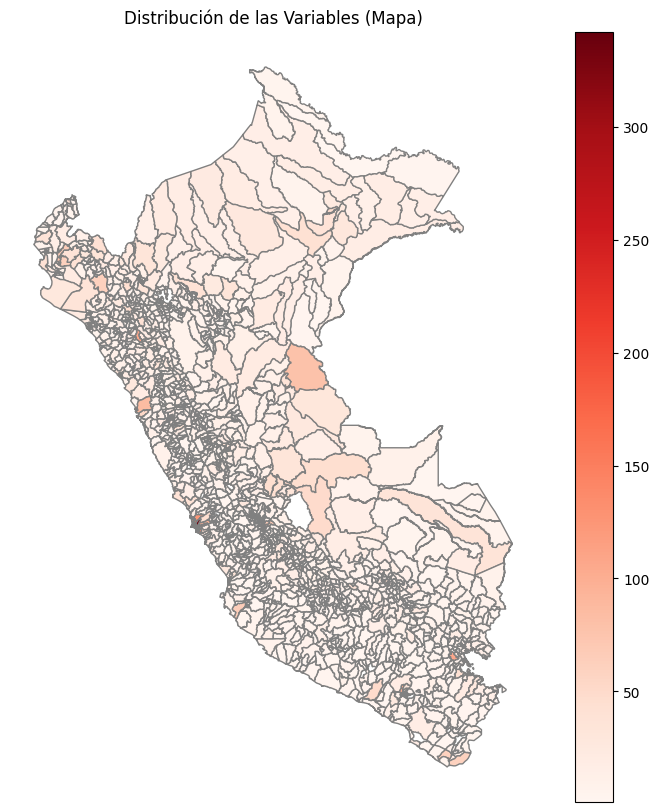

In [14]:
import matplotlib.pyplot as plt

# Crear figura y ejes
fig, ax = plt.subplots(figsize=(10, 10))

# Graficar el mapa con la variable 'Cantidad'
conteo_con_geom.plot(column='Cantidad', cmap='Reds', 
                     ax=ax, legend=True, 
                     linestyle='-', edgecolor='gray')

# Añadir título
ax.set_title("Distribución de las Variables (Mapa)")

# Quitar ejes si deseas
ax.axis('off')

# Guardar el gráfico como imagen PNG
plt.savefig("Distribución de escuelas secundarias.png", dpi=300, bbox_inches='tight')

# Mostrar el gráfico
plt.show()



<h1>TASK 2</h1>

Creamos la base de datos de Primarias solo para Huancavelica y Huancayo

In [15]:
dataset_cv = pd.merge(maps, cv_data, how="inner", on="UBIGEO")

# First, create a copy of the dataset to avoid modifying the original
school_data = dataset_cv.copy()

# Create a new column for school level
school_data['nivel_escolar'] = np.nan  # Initialize with NaN values

# Classify schools based on 'Nivel / Modalidad'
school_data.loc[school_data['Nivel / Modalidad'].str.contains('Inicial', case=False, na=False), 'nivel_escolar'] = 'Inicial'
school_data.loc[school_data['Nivel / Modalidad'].str.contains('Primaria', case=False, na=False), 'nivel_escolar'] = 'Primaria'
school_data.loc[school_data['Nivel / Modalidad'].str.contains('Secundaria', case=False, na=False), 'nivel_escolar'] = 'Secundaria'

# Filter the target regions
target_regions = ['HUANCAVELICA', 'AYACUCHO']
regional_schools = school_data[school_data['Departamento'].isin(target_regions)].copy()

# Convert latitude and longitude to numeric values
regional_schools['Latitud'] = pd.to_numeric(regional_schools['Latitud'], errors='coerce')
regional_schools['Longitud'] = pd.to_numeric(regional_schools['Longitud'], errors='coerce')

# Remove rows with missing coordinates
valid_schools = regional_schools.dropna(subset=['Latitud', 'Longitud']).copy()

# Create point geometry from coordinates
valid_schools['school_point'] = valid_schools.apply(
    lambda row: Point(row['Longitud'], row['Latitud']), axis=1
)

# Create a GeoDataFrame
school_gdf = gpd.GeoDataFrame(valid_schools, geometry='school_point', crs="EPSG:4326")

# Project to UTM for accurate distance calculations
school_gdf = school_gdf.to_crs(epsg=32718)  # UTM Zone 18S for Peru

# Count schools by level and region
print("School counts by region and level:")
print(school_gdf.groupby(['Departamento', 'nivel_escolar']).size())

C:\Users\user\AppData\Local\Temp\ipykernel_14436\1881202271.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Inicial' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  school_data.loc[school_data['Nivel / Modalidad'].str.contains('Inicial', case=False, na=False), 'nivel_escolar'] = 'Inicial'


School counts by region and level:
Departamento  nivel_escolar
AYACUCHO      Inicial          1733
              Primaria         1405
              Secundaria        535
HUANCAVELICA  Inicial          1569
              Primaria         1212
              Secundaria        393
dtype: int64


### Análisis para HUANCAVELICA

In [16]:
# Filter schools in Huancavelica
huancavelica_schools = school_gdf[school_gdf['Departamento'] == 'HUANCAVELICA'].copy()

# Separate by level
huancavelica_primary = huancavelica_schools[huancavelica_schools['nivel_escolar'] == 'Primaria'].copy()
huancavelica_secondary = huancavelica_schools[huancavelica_schools['nivel_escolar'] == 'Secundaria'].copy()

print(f"Number of primary schools in Huancavelica: {len(huancavelica_primary)}")
print(f"Number of secondary schools in Huancavelica: {len(huancavelica_secondary)}")

# Create 5km buffer around each primary school
# The geometry is already the school point (no need to calculate centroids)
huancavelica_primary['buffer_5km'] = huancavelica_primary['school_point'].buffer(5000)

# Count secondary schools within each buffer
nearby_counts = []

for idx, primary in huancavelica_primary.iterrows():
    buffer = primary['buffer_5km']
    # Count secondary schools within the buffer
    count = sum(huancavelica_secondary['school_point'].within(buffer))
    nearby_counts.append(count)

huancavelica_primary['secondary_count'] = nearby_counts

# Find schools with minimum and maximum counts
huancavelica_min_school = huancavelica_primary.loc[huancavelica_primary['secondary_count'].idxmin()]
huancavelica_max_school = huancavelica_primary.loc[huancavelica_primary['secondary_count'].idxmax()]


Number of primary schools in Huancavelica: 1212
Number of secondary schools in Huancavelica: 393


#### Huancavelica - Minimum Case

In [17]:
# Plot for Huancavelica school with minimum secondary schools
# Get the primary school with minimum secondary schools
min_school = huancavelica_min_school
min_buffer = min_school['buffer_5km']

# Find secondary schools within the buffer
sec_in_buffer = huancavelica_secondary[huancavelica_secondary['school_point'].within(min_buffer)]

# Create figure
plt.figure(figsize=(10, 10))
ax = plt.gca()

# Plot buffer (5km radius)
gpd.GeoSeries([min_buffer]).plot(
    ax=ax,
    color='lightblue',
    alpha=0.5,
    edgecolor='blue',
    linewidth=2
)

# Plot primary school
gpd.GeoSeries([min_school['school_point']]).plot(
    ax=ax,
    color='red',
    markersize=100,
    marker='*',
    label='Primary School'
)

# Plot secondary schools if any
if len(sec_in_buffer) > 0:
    gpd.GeoSeries(sec_in_buffer['school_point'].tolist()).plot(
        ax=ax,
        color='green',
        markersize=50,
        marker='o',
        label='Secondary Schools'
    )

# Title and styling
plt.title(
    f"Primary School with Fewest Nearby Secondary Schools\n"
    f"{min_school['Nombre de SS.EE.']} (HUANCAVELICA)",
    fontsize=14,
    pad=10
)

# Information box
plt.figtext(
    0.5, 0.05,
    f"Secondary schools within 5km: {min_school['secondary_count']}",
    ha='center',
    fontsize=12,
    bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.5')
)

plt.legend(loc='lower right')
plt.axis('off')  # Hide axis

# Save the figure with high quality
plt.savefig(
    'huancavelica_min_secondary.png',
    dpi=300,
    bbox_inches='tight',
    pad_inches=0.5
)

plt.close()  # Close the figure to free memory
print("Plot saved as 'huancavelica_min_secondary.png'")

Plot saved as 'huancavelica_min_secondary.png'


#### Huancavelica - Maximum Case

In [18]:
# Plot for Huancavelica school with maximum secondary schools
# Get the primary school with maximum secondary schools
max_school = huancavelica_max_school
max_buffer = max_school['buffer_5km']

# Find secondary schools within the buffer
sec_in_buffer = huancavelica_secondary[huancavelica_secondary['school_point'].within(max_buffer)]

# Create figure
plt.figure(figsize=(10, 10))
ax = plt.gca()

# Plot buffer (5km radius)
gpd.GeoSeries([max_buffer]).plot(
    ax=ax,
    color='lightyellow',
    alpha=0.5,
    edgecolor='orange',
    linewidth=2
)

# Plot primary school
gpd.GeoSeries([max_school['school_point']]).plot(
    ax=ax,
    color='red',
    markersize=100,
    marker='*',
    label='Primary School'
)

# Plot secondary schools
gpd.GeoSeries(sec_in_buffer['school_point'].tolist()).plot(
    ax=ax,
    color='green',
    markersize=50,
    marker='o',
    label='Secondary Schools'
)

# Title and styling
plt.title(
    f"Primary School with Most Nearby Secondary Schools\n"
    f"{max_school['Nombre de SS.EE.']} (HUANCAVELICA)",
    fontsize=14,
    pad=10
)

# Information box
plt.figtext(
    0.5, 0.05,
    f"Secondary schools within 5km: {max_school['secondary_count']}",
    ha='center',
    fontsize=12,
    bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.5')
)

plt.legend(loc='lower right')
plt.axis('off')  # Hide axis

# Save the figure with high quality
plt.savefig(
    'huancavelica_max_secondary.png',
    dpi=300,
    bbox_inches='tight',
    pad_inches=0.5
)

plt.close()  # Close the figure to free memory
print("Plot saved as 'huancavelica_max_secondary.png'")

Plot saved as 'huancavelica_max_secondary.png'


### Análisis para AYACUCHO

In [19]:
# Filter schools in Ayacucho
ayacucho_schools = school_gdf[school_gdf['Departamento'] == 'AYACUCHO'].copy()

# Separate by level
ayacucho_primary = ayacucho_schools[ayacucho_schools['nivel_escolar'] == 'Primaria'].copy()
ayacucho_secondary = ayacucho_schools[ayacucho_schools['nivel_escolar'] == 'Secundaria'].copy()

print(f"Number of primary schools in Ayacucho: {len(ayacucho_primary)}")
print(f"Number of secondary schools in Ayacucho: {len(ayacucho_secondary)}")

# Create 5km buffer around each primary school
ayacucho_primary['buffer_5km'] = ayacucho_primary['school_point'].buffer(5000)

# Count secondary schools within each buffer
nearby_counts = []

for idx, primary in ayacucho_primary.iterrows():
    buffer = primary['buffer_5km']
    # Count secondary schools within the buffer
    count = sum(ayacucho_secondary['school_point'].within(buffer))
    nearby_counts.append(count)

ayacucho_primary['secondary_count'] = nearby_counts

# Find schools with minimum and maximum counts
ayacucho_min_school = ayacucho_primary.loc[ayacucho_primary['secondary_count'].idxmin()]
ayacucho_max_school = ayacucho_primary.loc[ayacucho_primary['secondary_count'].idxmax()]



Number of primary schools in Ayacucho: 1405
Number of secondary schools in Ayacucho: 535


#### Ayacucho - Minimum Case

In [20]:
# Plot for Ayacucho school with minimum secondary schools
# Get the primary school with minimum secondary schools
min_school = ayacucho_min_school
min_buffer = min_school['buffer_5km']

# Find secondary schools within the buffer
sec_in_buffer = ayacucho_secondary[ayacucho_secondary['school_point'].within(min_buffer)]

# Create figure
plt.figure(figsize=(10, 10))
ax = plt.gca()

# Plot buffer (5km radius)
gpd.GeoSeries([min_buffer]).plot(
    ax=ax,
    color='mistyrose',
    alpha=0.5,
    edgecolor='darkred',
    linewidth=2
)

# Plot primary school
gpd.GeoSeries([min_school['school_point']]).plot(
    ax=ax,
    color='purple',
    markersize=100,
    marker='*',
    label='Primary School'
)

# Plot secondary schools if any
if len(sec_in_buffer) > 0:
    gpd.GeoSeries(sec_in_buffer['school_point'].tolist()).plot(
        ax=ax,
        color='darkorange',
        markersize=50,
        marker='o',
        label='Secondary Schools'
    )

# Title and styling
plt.title(
    f"Primary School with Fewest Nearby Secondary Schools\n"
    f"{min_school['Nombre de SS.EE.']} (AYACUCHO)",
    fontsize=14,
    pad=10
)

# Information box
plt.figtext(
    0.5, 0.05,
    f"Secondary schools within 5km: {min_school['secondary_count']}",
    ha='center',
    fontsize=12,
    bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.5')
)

plt.legend(loc='lower right')
plt.axis('off')  # Hide axis

# Save the figure with high quality
plt.savefig(
    'ayacucho_min_secondary.png',
    dpi=300,
    bbox_inches='tight',
    pad_inches=0.5
)

plt.close()  # Close the figure to free memory
print("Plot saved as 'ayacucho_min_secondary.png'")

Plot saved as 'ayacucho_min_secondary.png'


#### Ayacucho - Maximum Case

In [21]:
# Plot for Ayacucho school with maximum secondary schools
# Get the primary school with maximum secondary schools
max_school = ayacucho_max_school
max_buffer = max_school['buffer_5km']

# Find secondary schools within the buffer
sec_in_buffer = ayacucho_secondary[ayacucho_secondary['school_point'].within(max_buffer)]

# Create figure
plt.figure(figsize=(10, 10))
ax = plt.gca()

# Plot buffer (5km radius)
gpd.GeoSeries([max_buffer]).plot(
    ax=ax,
    color='honeydew',
    alpha=0.5,
    edgecolor='darkgreen',
    linewidth=2
)

# Plot primary school
gpd.GeoSeries([max_school['school_point']]).plot(
    ax=ax,
    color='purple',
    markersize=100,
    marker='*',
    label='Primary School'
)

# Plot secondary schools
gpd.GeoSeries(sec_in_buffer['school_point'].tolist()).plot(
    ax=ax,
    color='darkorange',
    markersize=50,
    marker='o',
    label='Secondary Schools'
)

# Title and styling
plt.title(
    f"Primary School with Most Nearby Secondary Schools\n"
    f"{max_school['Nombre de SS.EE.']} (AYACUCHO)",
    fontsize=14,
    pad=10
)

# Information box
plt.figtext(
    0.5, 0.05,
    f"Secondary schools within 5km: {max_school['secondary_count']}",
    ha='center',
    fontsize=12,
    bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.5')
)

plt.legend(loc='lower right')
plt.axis('off')  # Hide axis

# Save the figure with high quality
plt.savefig(
    'ayacucho_max_secondary.png',
    dpi=300,
    bbox_inches='tight',
    pad_inches=0.5
)

plt.close()  # Close the figure to free memory
print("Plot saved as 'ayacucho_max_secondary.png'")

Plot saved as 'ayacucho_max_secondary.png'


### Resumen

In [22]:
# Create a summary dataframe
summary_data = {
    'Region': ['HUANCAVELICA', 'HUANCAVELICA', 'AYACUCHO', 'AYACUCHO'],
    'Analysis Type': ['Minimum', 'Maximum', 'Minimum', 'Maximum'],
    'School Name': [
        huancavelica_min_school['Nombre de SS.EE.'], 
        huancavelica_max_school['Nombre de SS.EE.'], 
        ayacucho_min_school['Nombre de SS.EE.'], 
        ayacucho_max_school['Nombre de SS.EE.']
    ],
    'District': [
        huancavelica_min_school['Distrito'], 
        huancavelica_max_school['Distrito'], 
        ayacucho_min_school['Distrito'], 
        ayacucho_max_school['Distrito']
    ],
    'Secondary Schools (5km)': [
        huancavelica_min_school['secondary_count'], 
        huancavelica_max_school['secondary_count'], 
        ayacucho_min_school['secondary_count'], 
        ayacucho_max_school['secondary_count']
    ]
}

# Create dataframe
summary_df = pd.DataFrame(summary_data)

# Display summary
print("Summary of Results:")
print(summary_df)

# Calculate additional statistics
huancavelica_zeros = len(huancavelica_primary[huancavelica_primary['secondary_count'] == 0])
ayacucho_zeros = len(ayacucho_primary[ayacucho_primary['secondary_count'] == 0])

print("\nAdditional Insights:")
print(f"1. Primary schools in Huancavelica with no secondary schools within 5km: {huancavelica_zeros} ({huancavelica_zeros/len(huancavelica_primary)*100:.1f}%)")
print(f"2. Primary schools in Ayacucho with no secondary schools within 5km: {ayacucho_zeros} ({ayacucho_zeros/len(ayacucho_primary)*100:.1f}%)")

Summary of Results:
         Region Analysis Type                   School Name  \
0  HUANCAVELICA       Minimum                         22202   
1  HUANCAVELICA       Maximum                         36745   
2      AYACUCHO       Minimum                         38439   
3      AYACUCHO       Maximum  38001 GUSTAVO CASTRO PANTOJA   

                District  Secondary Schools (5km)  
0  SANTIAGO DE CHOCORVOS                        0  
1           HUANCAVELICA                       22  
2                  TAMBO                        0  
3               AYACUCHO                       81  

Additional Insights:
1. Primary schools in Huancavelica with no secondary schools within 5km: 116 (9.6%)
2. Primary schools in Ayacucho with no secondary schools within 5km: 168 (12.0%)


# TASK 3

### PARTE 1: Choropleth Maps for All Districts

In [23]:
maps = gpd.read_file('../shape_file/DISTRITOS.shp')
cv_data = pd.read_html('listado_iiee.xls')[0]

# Filtering by educational level
initial_schools = cv_data[cv_data['Nivel / Modalidad'].str.contains('Inicial', case=False, na=False)]
primary_schools = cv_data[cv_data['Nivel / Modalidad'].str.contains('Primaria', case=False, na=False)]
secondary_schools = cv_data[cv_data['Nivel / Modalidad'].str.contains('Secundaria', case=False, na=False)]

# Counting schools by district
initial_counts = initial_schools.groupby('Ubigeo').size().reset_index(name='initial_count')
primary_counts = primary_schools.groupby('Ubigeo').size().reset_index(name='primary_count')
secondary_counts = secondary_schools.groupby('Ubigeo').size().reset_index(name='secondary_count')

# Preparing data for merging
maps['IDDIST'] = maps['IDDIST'].astype(str)
initial_counts['Ubigeo'] = initial_counts['Ubigeo'].astype(str)
primary_counts['Ubigeo'] = primary_counts['Ubigeo'].astype(str)
secondary_counts['Ubigeo'] = secondary_counts['Ubigeo'].astype(str)

# Merging school counts with district geometries
maps = maps.merge(initial_counts, left_on='IDDIST', right_on='Ubigeo', how='left').drop(columns='Ubigeo')
maps = maps.merge(primary_counts, left_on='IDDIST', right_on='Ubigeo', how='left').drop(columns='Ubigeo')
maps = maps.merge(secondary_counts, left_on='IDDIST', right_on='Ubigeo', how='left').drop(columns='Ubigeo')

# Replacing NaN values with 0
maps.fillna(0, inplace=True)

# Simplifying geometry to improve performance
maps = maps.to_crs(epsg=4326)
maps['geometry'] = maps['geometry'].simplify(tolerance=0.01)

# Converting to GeoJSON format
districts_geojson = maps.to_json()

# Creating base map centered on Peru
peru_map = folium.Map(location=[-9.19, -75.0152], zoom_start=5, tiles='cartodbpositron')

# Function to add choropleth layers
def add_choropleth_layer(layer_name, data_column, color_scheme, legend_title):
    folium.Choropleth(
        geo_data=districts_geojson,
        name=layer_name,
        data=maps,
        columns=['IDDIST', data_column],
        key_on='feature.properties.IDDIST',
        fill_color=color_scheme,
        fill_opacity=0.7,
        line_opacity=0.8,
        line_color='black',
        legend_name=legend_title,
    ).add_to(peru_map)

# Adding the three educational level layers with different colors
add_choropleth_layer("Initial Education", "initial_count", "BuPu", "Initial Schools Count")
add_choropleth_layer("Primary Education", "primary_count", "OrRd", "Primary Schools Count")
add_choropleth_layer("Secondary Education", "secondary_count", "GnBu", "Secondary Schools Count")

# Adding layer control
folium.LayerControl().add_to(peru_map)

# Display the map directly in the notebook
display(peru_map)

### PARTE 2: Proximity maps for Huancavelica and Ayacucho

In [24]:
# Loading district shapefile
maps = gpd.read_file('../shape_file/DISTRITOS.shp')
cv_data = pd.read_html('listado_iiee.xls')[0]
maps = maps.to_crs(epsg=4326)

# Loading educational institutions data

cv_data = cv_data.dropna(subset=["Latitud", "Longitud"]).copy()

# Creating geometry points from coordinates
cv_data["geometry"] = cv_data.apply(lambda row: Point(row["Longitud"], row["Latitud"]), axis=1)
schools_gdf = gpd.GeoDataFrame(cv_data, geometry="geometry", crs="EPSG:4326").to_crs(epsg=32718)
schools_gdf = schools_gdf.to_crs(epsg=4326)

def create_and_display_region_map(region_name):
    print(f"Generating map for {region_name}...")
    
    # Filter data for the specified region
    region_schools = schools_gdf[schools_gdf['Departamento'].str.upper() == region_name.upper()]
    
    # Filter by school type
    primaries = region_schools[region_schools['Nivel / Modalidad'].str.contains("Primaria", case=False, na=False)].copy()
    secondaries = region_schools[region_schools['Nivel / Modalidad'].str.contains("Secundaria", case=False, na=False)].copy()

    # Basic stats
    print(f"Number of primary schools in {region_name}: {len(primaries)}")
    print(f"Number of secondary schools in {region_name}: {len(secondaries)}")
    
    # Convert to UTM projection for buffer analysis
    primaries_utm = primaries.to_crs(epsg=32718)
    secondaries_utm = secondaries.to_crs(epsg=32718)

    # Create 5km buffers around primary schools
    primaries_utm['buffer_5km'] = primaries_utm.geometry.buffer(5000)
    secondary_counts = []
    secondary_ids = []

    # Count secondary schools within each buffer
    for idx, primary in primaries_utm.iterrows():
        buffer_geom = primary['buffer_5km']
        schools_within = secondaries_utm[secondaries_utm.geometry.within(buffer_geom)]
        secondary_counts.append(len(schools_within))
        secondary_ids.append(schools_within.index.tolist())

    # Add counts and IDs to original dataframe
    primaries['nearby_secondaries'] = secondary_counts
    primaries['secondary_school_ids'] = secondary_ids

    # Find minimum and maximum cases
    min_count = primaries['nearby_secondaries'].min()
    max_count = primaries['nearby_secondaries'].max()
    
    print(f"Minimum secondary schools within 5km: {min_count}")
    print(f"Maximum secondary schools within 5km: {max_count}")

    min_primaries = primaries[primaries['nearby_secondaries'] == min_count]
    max_primaries = primaries[primaries['nearby_secondaries'] == max_count]
    
    print(f"Number of primary schools with minimum ({min_count}) secondary schools: {len(min_primaries)}")
    print(f"Number of primary schools with maximum ({max_count}) secondary schools: {len(max_primaries)}")

    # Create map centered on the region
    center = primaries.geometry.centroid.unary_union.centroid
    region_map = folium.Map(location=[center.y, center.x], zoom_start=8)

    def add_schools(schools_group, marker_color, label):
        for _, school in schools_group.iterrows():
            lat, lon = school.geometry.y, school.geometry.x

            # Add marker for the primary school
            folium.Marker(
                location=[lat, lon],
                popup=f"{label}: {school['Nombre de SS.EE.']}<br>Nearby secondary schools: {school['nearby_secondaries']}",
                icon=folium.Icon(color=marker_color)
            ).add_to(region_map)

            # Add 5km radius circle
            Circle(
                location=[lat, lon],
                radius=5000,
                color=marker_color,
                fill=True,
                fill_opacity=0.1
            ).add_to(region_map)

            # Add nearby secondary schools (if any exist)
            if school['nearby_secondaries'] > 0:
                ids = school['secondary_school_ids']
                nearby_schools = secondaries.loc[ids]
                for _, sec_school in nearby_schools.iterrows():
                    CircleMarker(
                        location=[sec_school.geometry.y, sec_school.geometry.x],
                        radius=3,
                        color='blue',
                        fill=True,
                        fill_opacity=0.7
                    ).add_to(region_map)

    # Add schools to the map
    add_schools(min_primaries, 'red', 'Primary with fewest secondary schools')
    add_schools(max_primaries, 'green', 'Primary with most secondary schools')
    
    # Add a legend
    legend_html = '''
    <div style="position: fixed; 
        bottom: 50px; left: 50px; width: 250px; height: 90px; 
        border:2px solid grey; z-index:9999; font-size:14px;
        background-color: white; padding: 10px;
        border-radius: 5px;">
        <div style="display: flex; align-items: center; margin-bottom: 5px;">
            <div style="width: 20px; height: 20px; background-color: red; margin-right: 5px;"></div>
            <div>Primary with fewest secondary schools ({0})</div>
        </div>
        <div style="display: flex; align-items: center; margin-bottom: 5px;">
            <div style="width: 20px; height: 20px; background-color: green; margin-right: 5px;"></div>
            <div>Primary with most secondary schools ({1})</div>
        </div>
        <div style="display: flex; align-items: center;">
            <div style="width: 10px; height: 10px; background-color: blue; border-radius: 50%; margin-right: 5px;"></div>
            <div>Secondary schools</div>
        </div>
    </div>
    '''.format(min_count, max_count)
    
    region_map.get_root().html.add_child(folium.Element(legend_html))
    
    # Display the map directly in the notebook
    display(region_map)
    print(f"✅ {region_name} map displayed.")
    print("-" * 50)

In [25]:
# Display maps for both regions
create_and_display_region_map('HUANCAVELICA')


Generating map for HUANCAVELICA...
Number of primary schools in HUANCAVELICA: 1224
Number of secondary schools in HUANCAVELICA: 397
Minimum secondary schools within 5km: 0
Maximum secondary schools within 5km: 22
Number of primary schools with minimum (0) secondary schools: 115
Number of primary schools with maximum (22) secondary schools: 2


C:\Users\user\AppData\Local\Temp\ipykernel_14436\1016309396.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = primaries.geometry.centroid.unary_union.centroid


✅ HUANCAVELICA map displayed.
--------------------------------------------------


In [26]:
create_and_display_region_map('AYACUCHO')

Generating map for AYACUCHO...
Number of primary schools in AYACUCHO: 1435
Number of secondary schools in AYACUCHO: 542
Minimum secondary schools within 5km: 0
Maximum secondary schools within 5km: 81
Number of primary schools with minimum (0) secondary schools: 168
Number of primary schools with maximum (81) secondary schools: 23


C:\Users\user\AppData\Local\Temp\ipykernel_14436\1016309396.py:63: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = primaries.geometry.centroid.unary_union.centroid


✅ AYACUCHO map displayed.
--------------------------------------------------


# Análisis del Contexto Geográfico: Huancavelica y Ayacucho 

## Huancavelica

### Observaciones del mapa
La visualización muestra claramente que:
- La escuela primaria con mayor cantidad de escuelas secundarias cercanas (22) está ubicada en el centro urbano de Huancavelica (capital).
- Las escuelas secundarias (puntos azules) están fuertemente concentradas a lo largo de la carretera principal y el centro urbano.
- La concentración urbana de servicios educativos es extrema, con prácticamente todas las escuelas secundarias agrupadas en un único núcleo.
- Los círculos verdes de 5km alrededor de las escuelas primarias con mayor acceso a secundarias apenas cubren un área pequeña y centralizada del territorio.

### Terreno
Huancavelica presenta una geografía montañosa severa que se evidencia en el mapa por:
- La presencia de numerosos ríos y quebradas (líneas azules/marrones sinuosas) que fragmentan el territorio.
- La concentración de asentamientos y vías de comunicación siguiendo los valles entre montañas.
- Las zonas periféricas al centro urbano principal muestran muy poca infraestructura vial y pocos asentamientos.

### Accesibilidad
El mapa refuerza lo extremadamente limitada que es la accesibilidad:
- La infraestructura vial es mínima, con una carretera principal (PE-26) que atraviesa el territorio.
- Las comunidades alejadas del eje vial principal quedan prácticamente desconectadas.
- La distribución de escuelas secundarias sigue estrictamente el eje vial, evidenciando que la accesibilidad es el factor determinante.

### Características Urbanas vs. Rurales
La imagen muestra un patrón mono-céntrico extremo:
- Un único centro urbano significativo (Huancavelica capital) concentra casi todos los servicios educativos secundarios.
- Localidades pequeñas como Sacsamarca, Antaccocha o Huaylacucho aparecen prácticamente desconectadas del centro principal.
- El contraste entre centro urbano (concentración de puntos azules) y periferia rural es dramático.

## Ayacucho

### Observaciones del mapa
La visualización muestra un patrón significativamente distinto:
- La escuela primaria con mayor número de escuelas secundarias cercanas (81) está ubicada en un entorno mucho más densamente poblado.
- La concentración de escuelas secundarias (puntos azules) dentro del radio de 5km es notablemente superior (81 vs. 22 en Huancavelica).
- Existe un patrón policéntrico, con múltiples marcadores de escuelas con alto acceso a educación secundaria.
- El área urbana representada muestra una estructura más compleja y extensa.

### Terreno
Aunque también montañoso, el mapa de Ayacucho muestra:
- Un valle más amplio donde se ubica la ciudad principal, con más espacio para desarrollo urbano.
- Una red hidrográfica presente pero menos limitante que en Huancavelica.
- Zonas de menor pendiente que permiten asentamientos más dispersos y mejor conectados.

### Accesibilidad
La red de conectividad se muestra significativamente más desarrollada:
- Mayor cantidad de vías secundarias que se ramifican desde las principales.
- Múltiples centros poblados conectados entre sí, no solo dependientes de un eje central.
- La distribución espacial de escuelas secundarias es menos lineal y más dispersa en el territorio.

### Características Urbanas vs. Rurales
Ayacucho muestra un patrón más equilibrado:
- Un centro urbano principal de mayor tamaño y complejidad (Ayacucho/Huamanga).
- Centros urbanos secundarios visibles en el mapa como San Juan de Viñaca, Compañía, entre otros.
- Mayor densidad poblacional evidenciada por la concentración de asentamientos y topónimos en el mapa.
- La cifra de 81 escuelas secundarias en un radio de 5km evidencia un entorno mucho más urbanizado y con mayor oferta educativa.

## Conclusiones actualizadas

1. **Contraste en el acceso educativo**: La diferencia entre 22 escuelas secundarias (máximo en Huancavelica) vs. 81 escuelas secundarias (máximo en Ayacucho) refleja una brecha significativa en las oportunidades educativas entre ambas regiones.

2. **Patrones de urbanización distintos**: Huancavelica presenta un modelo mono-céntrico extremo, mientras Ayacucho muestra un patrón más equilibrado y policéntrico.

3. **Influencia determinante de la topografía**: En Huancavelica, la concentración lineal de escuelas a lo largo del eje vial principal evidencia cómo el relieve montañoso restringe severamente el desarrollo de infraestructura educativa.

4. **Implicaciones para políticas públicas**: 
   - En Huancavelica se requieren soluciones más radicales para garantizar acceso a educación secundaria (internados regionales, educación a distancia, transporte subsidiado).
   - En Ayacucho, aunque con mejor situación relativa, persisten zonas periféricas desconectadas que necesitan intervenciones focalizadas.

5. **Centralización vs. Descentralización**: La distribución educativa en Huancavelica ejemplifica un patrón de centralización extrema de servicios, mientras Ayacucho presenta un modelo más descentralizado con múltiples núcleos educativos.

Estas observaciones basadas en los mapas refuerzan la necesidad de planificación territorial diferenciada para ambas regiones, considerando sus particulares condiciones geográficas y patrones de asentamiento.


In [27]:
!jupyter nbconvert --to script hw3_248489.ipynb


[NbConvertApp] Converting notebook hw3_248489.ipynb to script
[NbConvertApp] Writing 33314 bytes to hw3_248489.py
